### Universidad Santo Tomás

#### Visualización ciencia de datos en python

#####  Segunda Entrega Proyecto

###### Participantes:

- **Diana Bayona**
- **Jhon Castro**
- **Alejandra Rozo**



### contexto de la base

La base de datos representa las operaciones de crédito colocadas en el sector agropecuario colombiano en el 2020, así se presenta el mes y año en la que esta, así la colocación de crédito se refiere al otorgamiento de préstamos monetarios que se emiten a un cliente. En la base de datos se encuentra el valor de la inversión que tiene el cliente y el valor por el que fue otorgado el crédito, como los datos en el pazo en el que será pagado el crédito y el departamento y municipio en la que se hará la inversión y colocación.
Dichos recursos pueden ser colocados en condiciones FINAGRO a través de tres carteras que son conocidas como fuentes de colocación: Redescuento, que corresponde a las colocaciones con recursos totalmente respaldados con Títulos de Desarrollo Agropecuario (TDA), Sustitutiva. el valor de la cartera agropecuaria otorgada con recursos propios, que corresponde a las colocaciones con recursos que compensan la inversión en TDA con diferentes factores de ponderación. Estos factores son: del 25 % para grandes productores; del 50 %, para medianos productores, y del 150 %, para pequeños productores y para operaciones de microcrédito, y Cartera Agropecuaria, que corresponde a los recursos propios de las instituciones financieras.
Con respecto a los productores se clasifican en tres, Productor Pequeño: Generalmente es una actividad familiar, entre 25 a 30 hectáreas máximo, lo que Tienen lo destinan al autoconsumo, la actividad agropecuaria constituye una forma de satisfacer sus necesidades básicas. Productor Mediano: 30 a 100 hectáreas, hay mas tecnología, contrata mano de obra en ciertos periodos y a pequeña escala asalariada y están mejor económicamente que los Pequeños. Productor Grande: Más de 100 hectáreas, en general se convierten en empresas industriales que transforman la materia prima en productos. 
Una línea de crédito es un contrato por el cual la entidad financiera pone a disposición del usuario una cierta cantidad de dinero por un período determinado, para este caso es de inversión, normalización de cartera y capital de trabajo.

### Librerias

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
import altair as alt
from vega_datasets import data
from matplotlib import cm
from math import log10
import matplotlib.ticker as mtick
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
px.set_mapbox_access_token("pk.eyJ1IjoianVhbmRzYXJtaWVudG8tcGFyYW1vIiwiYSI6ImNrbm0yNzlyczBkanIyd285dDhmd3ZpZ3kifQ.Pp22Yn1Qo5AL2xFTFipi-Q")


pd.set_option('display.max_columns', None) #Mostrar todas las columnas
sns.set(rc={'figure.figsize':(15,9)})

In [5]:
import plotly.offline as pyo
pyo.init_notebook_mode()

In [6]:
pd.set_option('display.max_columns', None) #Mostrar todas las columnas
sns.set(rc={'figure.figsize':(12.7,8.6)})

In [7]:
sns.set(font_scale=1.4)

def reformat_large_tick_values(tick_val, pos):
    """
    Turns large tick values (in the billions, millions and thousands) such as 4500 into 4.5K and also appropriately turns 4000 into 4K (no zero after the decimal).
    """
    if tick_val >= 1000000000:
        val = round(tick_val/1000000000, 1)
        new_tick_format = '{:}B'.format(val)
    elif tick_val >= 1000000:
        val = round(tick_val/1000000, 1)
        new_tick_format = '{:}M'.format(val)
    elif tick_val >= 1000:
        val = round(tick_val/1000, 1)
        new_tick_format = '{:}K'.format(val)
    elif tick_val < 1000:
        new_tick_format = round(tick_val, 1)
    else:
        new_tick_format = tick_val

    # make new_tick_format into a string value
    new_tick_format = str(new_tick_format)
    
    # code below will keep 4.5M as is but change values such as 4.0M to 4M since that zero after the decimal isn't needed
    index_of_decimal = new_tick_format.find(".")
    
    if index_of_decimal != -1:
        value_after_decimal = new_tick_format[index_of_decimal+1]
        if value_after_decimal == "0":
            # remove the 0 after the decimal point since it's not needed
            new_tick_format = new_tick_format[0:index_of_decimal] + new_tick_format[index_of_decimal+2:]
            
    return new_tick_format

#https://dfrieds.com/data-visualizations/how-format-large-tick-values.html

### Importación de datos

In [8]:
df_colocaciones = pd.read_csv('C:/Users/july3/Downloads/Colocaciones_de_cr_dito_Sector_Agropecuario_2020 (1).csv', 
                 sep = ',', thousands=',', decimal='.')

Se referencia los [Datos abiertos Colocaciones de crédito Sector Agropecuario 2020](https://www.datos.gov.co/Agricultura-y-Desarrollo-Rural/Colocaciones-de-cr-dito-Sector-Agropecuario-2020/hbaj-th4x/data) adicionalmente podemos encontrar la tabla de contenido, del significado de cada variable

In [9]:
df_colocaciones.head()

,Año,Mes,fuente Colocacion,Id Tipo Prod,Tipo Productor,Valor Inversion,Colocacion,ID Depto,Departamento Inversion,Id Munic,Municipio Inversion,Municipio de PostConflico?,DEPCOL,Departamento de Colocacion de Credito,MUNCOL,Municipio Colocacion de Credito,Plazo,Linea de Credito,Linea de Produccion,ID Rubro,Destino de Credito,Genero,% FAG,Vlr Inic Garantia,LATITUD,LONGITUD,CANTIDAD,Coordenada
0,2020,1,REDESCUENTO,0,PEQUEÑO,5500000.0,5500000.0,52,NARIÑO,52694,SAN PEDRO DE CARTAGO,N,52,NARIÑO,52399,LA UNION,60,Inversión,MAQUINARIA Y EQUIPO (I),447600,MAQUINARIA USADA,HOMBRE,80.0,4400000.0,1.561389,-77.118056,1,POINT (-77.1180556 1.5613889)
1,2020,1,REDESCUENTO,0,PEQUEÑO,21000000.0,21000000.0,23,CORDOBA,23500,MONITOS,N,23,CORDOBA,23500,MONITOS,72,Inversión,SIEMBRAS (I),141430,PLATANO - INVERSIÓN,MUJER,80.0,16800000.0,8.250000,-76.050000,1,POINT (-76.05 8.25)
2,2020,1,REDESCUENTO,0,PEQUEÑO,6000000.0,4130000.0,15,BOYACA,15176,CHIQUINQUIRA,N,15,BOYACA,15176,CHIQUINQUIRA,24,Capital de Trabajo,SOSTENIMIENTO (CT),160000,CAPITAL DE TRABAJO UNIDAD PROD CAMPESINA,HOMBRE,80.0,3304000.0,5.633333,-73.750000,1,POINT (-73.75 5.6333333)
3,2020,1,REDESCUENTO,0,PEQUEÑO,9000000.0,6000000.0,25,CUNDINAMARCA,25377,LA CALERA,N,25,CUNDINAMARCA,25377,LA CALERA,24,Capital de Trabajo,SOSTENIMIENTO (CT),237280,CEBA BOVINA - SOSTENIMIENTO,MUJER,80.0,4800000.0,4.750000,-73.916667,1,POINT (-73.9166667 4.75)
4,2020,1,REDESCUENTO,0,PEQUEÑO,4000000.0,4000000.0,50,META,50573,PUERTO LOPEZ,N,50,META,50573,PUERTO LOPEZ,60,Inversión,MAQUINARIA Y EQUIPO (I),447350,EQUIPOS PARA ACUICULTURA Y PESCA,HOMBRE,80.0,3200000.0,4.083333,-72.966667,1,POINT (-72.9666667 4.0833333)


Contexto de la base de datos

In [10]:
lan_lon = pd.read_csv('C:/Users/july3/Downloads/col-adm1-departments.csv', 
                 sep = ',', thousands=',', decimal='.')

Se toma la latitud y longitud de los departamentos de Colombia dado que los referenciados en la base de datos son de los municipios. Esta base es tomada de GitHub del repositorio de [geodata](https://github.com/datasketch/geodata/blob/master/inst/geodata/col/col-adm1-departments.csv) 

In [11]:
lan_lon.head()

,id,name,lon,lat
0,5,ANTIOQUIA,-75.59120,6.913161
1,8,ATLANTICO,-74.97943,10.660840
2,11,"BOGOTA, D.C.",-74.21088,4.286616
3,13,BOLIVAR,-74.51479,8.716290
4,15,BOYACA,-73.12136,5.755396


**Unión de las bases**

Se unifican las bases según el ID del departamento.

In [12]:
df = df_colocaciones.merge(lan_lon, 
                             left_on='ID Depto', 
                             right_on='id', 
                             how = 'left')
print('Dimension bases unidas: ', df.shape)

Dimension bases unidas:  (513235, 32)


In [13]:
df

,Año,Mes,fuente Colocacion,Id Tipo Prod,Tipo Productor,Valor Inversion,Colocacion,ID Depto,Departamento Inversion,Id Munic,Municipio Inversion,Municipio de PostConflico?,DEPCOL,Departamento de Colocacion de Credito,MUNCOL,Municipio Colocacion de Credito,Plazo,Linea de Credito,Linea de Produccion,ID Rubro,Destino de Credito,Genero,% FAG,Vlr Inic Garantia,LATITUD,LONGITUD,CANTIDAD,Coordenada,id,name,lon,lat
0,2020,1,REDESCUENTO,0,PEQUEÑO,5500000.0,5500000.0,52,NARIÑO,52694,SAN PEDRO DE CARTAGO,N,52,NARIÑO,52399,LA UNION,60,Inversión,MAQUINARIA Y EQUIPO (I),447600,MAQUINARIA USADA,HOMBRE,80.0,4400000.0,1.561389,-77.118056,1,POINT (-77.1180556 1.5613889),52,NARIÑO,-77.88662,1.542956
1,2020,1,REDESCUENTO,0,PEQUEÑO,21000000.0,21000000.0,23,CORDOBA,23500,MONITOS,N,23,CORDOBA,23500,MONITOS,72,Inversión,SIEMBRAS (I),141430,PLATANO - INVERSIÓN,MUJER,80.0,16800000.0,8.250000,-76.050000,1,POINT (-76.05 8.25),23,CORDOBA,-75.79988,8.350605
2,2020,1,REDESCUENTO,0,PEQUEÑO,6000000.0,4130000.0,15,BOYACA,15176,CHIQUINQUIRA,N,15,BOYACA,15176,CHIQUINQUIRA,24,Capital de Trabajo,SOSTENIMIENTO (CT),160000,CAPITAL DE TRABAJO UNIDAD PROD CAMPESINA,HOMBRE,80.0,3304000.0,5.633333,-73.750000,1,POINT (-73.75 5.6333333),15,BOYACA,-73.12136,5.755396
3,2020,1,REDESCUENTO,0,PEQUEÑO,9000000.0,6000000.0,25,CUNDINAMARCA,25377,LA CALERA,N,25,CUNDINAMARCA,25377,LA CALERA,24,Capital de Trabajo,SOSTENIMIENTO (CT),237280,CEBA BOVINA - SOSTENIMIENTO,MUJER,80.0,4800000.0,4.750000,-73.916667,1,POINT (-73.9166667 4.75),25,CUNDINAMARCA,-74.11696,4.796094
4,2020,1,REDESCUENTO,0,PEQUEÑO,4000000.0,4000000.0,50,META,50573,PUERTO LOPEZ,N,50,META,50573,PUERTO LOPEZ,60,Inversión,MAQUINARIA Y EQUIPO (I),447350,EQUIPOS PARA ACUICULTURA Y PESCA,HOMBRE,80.0,3200000.0,4.083333,-72.966667,1,POINT (-72.9666667 4.0833333),50,META,-72.96355,3.315483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513230,2020,11,REDESCUENTO,0,PEQUEÑO,8000000.0,8000000.0,52,NARIÑO,52001,PASTO,N,52,NARIÑO,52001,PASTO,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,80.0,6400000.0,1.214671,-77.278647,1,POINT (-77.27864742 1.214670737),52,NARIÑO,-77.88662,1.542956
513231,2020,11,REDESCUENTO,0,PEQUEÑO,10000000.0,10000000.0,41,HUILA,41359,ISNOS,N,41,HUILA,41359,ISNOS,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,80.0,8000000.0,2.083333,-76.250000,1,POINT (-76.25 2.0833333),41,HUILA,-75.63745,2.535022
513232,2020,11,REDESCUENTO,0,PEQUEÑO,2000000.0,2000000.0,17,CALDAS,17042,ANSERMA,N,17,CALDAS,17042,ANSERMA,13,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,80.0,1600000.0,5.250000,-75.750000,1,POINT (-75.75 5.25),17,CALDAS,-75.33511,5.329302
513233,2020,11,REDESCUENTO,0,PEQUEÑO,7200000.0,7200000.0,25,CUNDINAMARCA,25885,YACOPI,N,25,CUNDINAMARCA,25885,YACOPI,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,80.0,5760000.0,5.666667,-74.416667,1,POINT (-74.4166667 5.6666667),25,CUNDINAMARCA,-74.11696,4.796094


Atributos y tipos de atributos

In [14]:
df.dtypes

Año                                        int64
Mes                                        int64
fuente Colocacion                         object
Id Tipo Prod                               int64
Tipo Productor                            object
Valor Inversion                          float64
Colocacion                               float64
ID Depto                                   int64
Departamento Inversion                    object
Id Munic                                   int64
Municipio Inversion                       object
Municipio de PostConflico?                object
DEPCOL                                     int64
Departamento de Colocacion de Credito     object
MUNCOL                                     int64
Municipio Colocacion de Credito           object
Plazo                                      int64
Linea de Credito                          object
Linea de Produccion                       object
ID Rubro                                   int64
Destino de Credito  

In [15]:
df['Linea de Produccion'].value_counts()

SOSTENIMIENTO (CT)                 134966
SIEMBRAS (I)                       114552
COMPRA DE ANIMALES (I)             112564
MICROCREDITO (CT)                   57451
PRODUCCIÓN (CT)                     29660
INFRAEST Y ADECU DE TIERRAS (I)     24493
COMERCIALIZACION (CT)               10828
OTRAS ACTIVIDADES (I)                6677
MAQUINARIA Y EQUIPO (I)              6539
COMERCIALIZACION (I)                 5400
SERVICIOS DE APOYO (CT)              5209
CONSOLIDACION DE PASIVOS (N)         1857
ACTIVIDADES RURALES (CT)             1697
SERVICIOS DE APOYO (I)                604
ACTIVIDADES RURALES (I)               534
SERVICIOS DE APOYO  (I)               204
Name: Linea de Produccion, dtype: int64

Se identifica que hay una categoría repetida _SERVICIOS DE APOYO (I)_ y _SERVICIOS DE APOYO   (I)_, por lo cual se busca dejar una sola categoría debido a que las dos se refieren a lo mismo y la diferencia consiste en un espacio adicional.

In [16]:
lp=["ACTIVIDADES RURALES (CT)","ACTIVIDADES RURALES (I)",  "COMERCIALIZACION (CT)" ,      
  "COMERCIALIZACION (I)" ,    "COMPRA DE ANIMALES (I)" ,  "CONSOLIDACION DE PASIVOS (N)",   
  "INFRAEST Y ADECU DE TIERRAS (I)", "MAQUINARIA Y EQUIPO (I)", "MICROCREDITO (CT)",             
  "OTRAS ACTIVIDADES (I)", "PRODUCCIÓN (CT)", "SERVICIOS DE APOYO (CT)",        
  "SERVICIOS DE APOYO (I)", "SIEMBRAS (I)", "SOSTENIMIENTO (CT)"]
b=df[~df['Linea de Produccion'].isin(lp)]

In [17]:
b['Linea de Produccion']="SERVICIOS DE APOYO (I)"
c=df[df['Linea de Produccion'].isin(lp)]

In [18]:
df0=pd.concat([b, c])
df0.shape

(513235, 32)

In [19]:
df0['Linea de Produccion'].value_counts()

SOSTENIMIENTO (CT)                 134966
SIEMBRAS (I)                       114552
COMPRA DE ANIMALES (I)             112564
MICROCREDITO (CT)                   57451
PRODUCCIÓN (CT)                     29660
INFRAEST Y ADECU DE TIERRAS (I)     24493
COMERCIALIZACION (CT)               10828
OTRAS ACTIVIDADES (I)                6677
MAQUINARIA Y EQUIPO (I)              6539
COMERCIALIZACION (I)                 5400
SERVICIOS DE APOYO (CT)              5209
CONSOLIDACION DE PASIVOS (N)         1857
ACTIVIDADES RURALES (CT)             1697
SERVICIOS DE APOYO (I)                808
ACTIVIDADES RURALES (I)               534
Name: Linea de Produccion, dtype: int64

#### Completitud

Valores faltantes

In [20]:
for col in df.columns:
    num_missing = df0[col].isnull().sum()  
    pct_missing = np.mean(df0[col].isnull())
    #print(col," - ",round(pct_missing*100, 2),"% - ",num_missing)
    print('{} - {}% - {}'.format(col,round(pct_missing*100, 2),num_missing))

Año - 0.0% - 0
Mes - 0.0% - 0
fuente Colocacion - 0.0% - 0
Id Tipo Prod - 0.0% - 0
Tipo Productor - 0.0% - 0
Valor Inversion - 0.0% - 0
Colocacion - 0.0% - 0
ID Depto - 0.0% - 0
Departamento Inversion - 0.0% - 0
Id Munic - 0.0% - 0
Municipio Inversion - 0.0% - 0
Municipio de PostConflico? - 0.0% - 0
DEPCOL - 0.0% - 0
Departamento de Colocacion de Credito - 0.0% - 0
MUNCOL - 0.0% - 0
Municipio Colocacion de Credito - 0.0% - 0
Plazo - 0.0% - 0
Linea de Credito - 0.0% - 0
Linea de Produccion - 0.0% - 0
ID Rubro - 0.0% - 0
Destino de Credito - 0.0% - 0
Genero - 0.0% - 0
% FAG - 46.07% - 236472
Vlr Inic Garantia - 46.07% - 236472
LATITUD - 0.0% - 0
LONGITUD - 0.0% - 0
CANTIDAD - 0.0% - 0
Coordenada - 0.0% - 0
id - 0.0% - 0
name - 0.0% - 0
lon - 0.0% - 0
lat - 0.0% - 0


Las variables % FAG y Vlr Inic Garantia tienen un porcentaje de 46.07% de datos faltantes, esta variable representa el Fondo Agropecuario de Garantias la cual indica el valor del fondo con el que se busca respaldar los créditos concedidos por Finagro. Se decide eliminar estas variables debido a que son cuantitativas y no se puede clasificar en la categoría "perdido", así mismo su alto porcentaje de datos faltantes hace que la imputación no sea una vía adecuada. Al igual se eliminan las variables id  y name debido a que ya están replicadas como ID Depto y Departamento Inversion.

### Seleccionar columnas sin variables %FAG y Vlr Garantia

In [21]:
columns = ["Año",
           "Mes",
           "fuente Colocacion",
           "Id Tipo Prod" ,
           "Tipo Productor" ,
           "Valor Inversion",
           "Colocacion" ,
           "ID Depto" ,
           "Departamento Inversion",
           "Id Munic" ,
           "Municipio Inversion",
           "Municipio de PostConflico?" ,
           "DEPCOL",
           "Departamento de Colocacion de Credito",
           "MUNCOL",
           "Municipio Colocacion de Credito",
           "Plazo",
           "Linea de Credito" ,
           "Linea de Produccion",
           "ID Rubro",
           "Destino de Credito" ,
           "Genero",
           "LATITUD",
           "LONGITUD",
           "CANTIDAD",
           "Coordenada",
           "lon",
           "lat"
          ]
df2 = df0.copy()
df2 = df0[columns]
df2

,Año,Mes,fuente Colocacion,Id Tipo Prod,Tipo Productor,Valor Inversion,Colocacion,ID Depto,Departamento Inversion,Id Munic,Municipio Inversion,Municipio de PostConflico?,DEPCOL,Departamento de Colocacion de Credito,MUNCOL,Municipio Colocacion de Credito,Plazo,Linea de Credito,Linea de Produccion,ID Rubro,Destino de Credito,Genero,LATITUD,LONGITUD,CANTIDAD,Coordenada,lon,lat
66,2020,1,AGROPECUARIA,0,PEQUEÑO,19727000.0,15000000.0,76,VALLE,76622,ROLDANILLO,S,76,VALLE,76622,ROLDANILLO,17,Normalización de Cartera,SERVICIOS DE APOYO (I),741050,741050 MAQUINARIA Y EQUIPOS - NUEVO - SERVICIO...,MUJER,4.414722,-76.154722,1,POINT (-76.1547222 4.4147222),-76.53093,3.862996
1406,2020,1,REDESCUENTO,1,MEDIANO,100000000.0,90000000.0,68,SANTANDER,68001,BUCARAMANGA,N,68,SANTANDER,68001,BUCARAMANGA,48,Inversión,SERVICIOS DE APOYO (I),741250,INFRAESTRUCTURA - SERVICIOS APOYO,PERSONA JURÍDICA,7.129722,-73.125833,1,POINT (-73.1258333 7.1297222),-73.51160,6.672611
1611,2020,1,REDESCUENTO,0,PEQUEÑO,60000000.0,60000000.0,63,QUINDIO,63690,SALENTO,N,63,QUINDIO,63690,SALENTO,60,Inversión,SERVICIOS DE APOYO (I),741160,TRANSP. NO ESPCLZDO - SERVICIOS APOYO,HOMBRE,4.666667,-75.500000,1,POINT (-75.5 4.6666667),-75.68725,4.476064
5036,2020,1,SUSTITUTA,0,PEQUEÑO,95000000.0,90000000.0,17,CALDAS,17442,MARMATO,N,17,CALDAS,17777,SUPIA,60,Inversión,SERVICIOS DE APOYO (I),741300,CENTROS DE ARRENDAMIENTO DE MAQ.AGRICOLA,HOMBRE,5.500000,-75.583333,1,POINT (-75.5833333 5.5),-75.33511,5.329302
5848,2020,1,SUSTITUTA,0,PEQUEÑO,100000000.0,100000000.0,41,HUILA,41524,PALERMO,N,11,BOGOTA D.E.,11001,SANTAFE DE BOGOTA D.C.,60,Inversión,SERVICIOS DE APOYO (I),741250,INFRAESTRUCTURA - SERVICIOS APOYO,MUJER,3.000000,-75.500000,1,POINT (-75.5 3),-75.63745,2.535022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513230,2020,11,REDESCUENTO,0,PEQUEÑO,8000000.0,8000000.0,52,NARIÑO,52001,PASTO,N,52,NARIÑO,52001,PASTO,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,1.214671,-77.278647,1,POINT (-77.27864742 1.214670737),-77.88662,1.542956
513231,2020,11,REDESCUENTO,0,PEQUEÑO,10000000.0,10000000.0,41,HUILA,41359,ISNOS,N,41,HUILA,41359,ISNOS,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,2.083333,-76.250000,1,POINT (-76.25 2.0833333),-75.63745,2.535022
513232,2020,11,REDESCUENTO,0,PEQUEÑO,2000000.0,2000000.0,17,CALDAS,17042,ANSERMA,N,17,CALDAS,17042,ANSERMA,13,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,5.250000,-75.750000,1,POINT (-75.75 5.25),-75.33511,5.329302
513233,2020,11,REDESCUENTO,0,PEQUEÑO,7200000.0,7200000.0,25,CUNDINAMARCA,25885,YACOPI,N,25,CUNDINAMARCA,25885,YACOPI,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,5.666667,-74.416667,1,POINT (-74.4166667 5.6666667),-74.11696,4.796094


#### Coherencia

Valores duplicados

In [22]:
df2[df2.duplicated()]

,Año,Mes,fuente Colocacion,Id Tipo Prod,Tipo Productor,Valor Inversion,Colocacion,ID Depto,Departamento Inversion,Id Munic,Municipio Inversion,Municipio de PostConflico?,DEPCOL,Departamento de Colocacion de Credito,MUNCOL,Municipio Colocacion de Credito,Plazo,Linea de Credito,Linea de Produccion,ID Rubro,Destino de Credito,Genero,LATITUD,LONGITUD,CANTIDAD,Coordenada,lon,lat
26748,2020,1,SUSTITUTA,2,GRANDE,85775240.0,116241580.0,11,BOGOTA D.E.,11001,SANTAFE DE BOGOTA D.C.,N,11,BOGOTA D.E.,11001,SANTAFE DE BOGOTA D.C.,24,Normalización de Cartera,SERVICIOS DE APOYO (I),741150,TRANSP. ESPCLZDO - SERVICIOS APOYO,PERSONA JURÍDICA,4.600000,-74.083333,1,POINT (-74.0833333 4.6),-74.21088,4.286616
97433,2020,3,SUSTITUTA,2,GRANDE,332246000.0,332246000.0,76,VALLE,76890,YOTOCO,N,76,VALLE,76001,CALI,60,Inversión,SERVICIOS DE APOYO (I),741150,TRANSP. ESPCLZDO - SERVICIOS APOYO,PERSONA JURÍDICA,3.916667,-76.333333,1,POINT (-76.3333333 3.9166667),-76.53093,3.862996
411,2020,1,REDESCUENTO,0,PEQUEÑO,10000000.0,10000000.0,25,CUNDINAMARCA,25148,CAPARRAPI,N,25,CUNDINAMARCA,25148,CAPARRAPI,24,Capital de Trabajo,SOSTENIMIENTO (CT),237280,CEBA BOVINA - SOSTENIMIENTO,MUJER,5.416667,-74.583333,1,POINT (-74.5833333 5.4166667),-74.11696,4.796094
447,2020,1,REDESCUENTO,0,PEQUEÑO,30000000.0,30000000.0,25,CUNDINAMARCA,25535,PASCA,N,25,CUNDINAMARCA,25535,PASCA,8,Capital de Trabajo,PRODUCCIÓN (CT),111500,PAPA,HOMBRE,4.333333,-74.283333,1,POINT (-74.2833333 4.3333333),-74.11696,4.796094
582,2020,1,REDESCUENTO,0,PEQUEÑO,15000000.0,12000000.0,15,BOYACA,15842,UMBITA,N,15,BOYACA,15842,UMBITA,60,Inversión,COMPRA DE ANIMALES (I),253400,VIENTRES BOVINOS CRIA Y DOBLE PROPOSITO,MUJER,5.233333,-73.450000,1,POINT (-73.45 5.2333333),-73.12136,5.755396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513217,2020,11,REDESCUENTO,0,PEQUEÑO,6000000.0,6000000.0,73,TOLIMA,73283,FRESNO,N,73,TOLIMA,73283,FRESNO,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,5.166667,-75.083333,1,POINT (-75.0833333 5.1666667),-75.26350,4.040248
513219,2020,11,REDESCUENTO,0,PEQUEÑO,7000000.0,7000000.0,52,NARIÑO,52036,ANCUYA,N,52,NARIÑO,52480,NARIÑO,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,1.250000,-77.500000,1,POINT (-77.5 1.25),-77.88662,1.542956
513221,2020,11,REDESCUENTO,0,PEQUEÑO,8700000.0,8700000.0,73,TOLIMA,73555,PLANADAS,S,73,TOLIMA,73555,PLANADAS,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,H,3.250000,-75.750000,1,POINT (-75.75 3.25),-75.26350,4.040248
513225,2020,11,REDESCUENTO,0,PEQUEÑO,7000000.0,7000000.0,17,CALDAS,17614,RIOSUCIO,N,17,CALDAS,17614,RIOSUCIO,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,H,5.379167,-75.616111,1,POINT (-75.6161111 5.3791667),-75.33511,5.329302


Como se puede evidenciar la base original tiene 24769  datos duplicados

In [23]:
df_dedupped = df2.drop_duplicates()
print(df2.shape)
print(df_dedupped.shape)

(513235, 28)
(488466, 28)


#### Consistencia

Se crea la variable M que tiene el mes en que se realizó la colocación de crédito en un formato temporal.

In [24]:
df_dedupped['M'] = pd.to_datetime(df_dedupped['Mes'],format='%m')

In [25]:
df_dedupped.dtypes

Año                                               int64
Mes                                               int64
fuente Colocacion                                object
Id Tipo Prod                                      int64
Tipo Productor                                   object
Valor Inversion                                 float64
Colocacion                                      float64
ID Depto                                          int64
Departamento Inversion                           object
Id Munic                                          int64
Municipio Inversion                              object
Municipio de PostConflico?                       object
DEPCOL                                            int64
Departamento de Colocacion de Credito            object
MUNCOL                                            int64
Municipio Colocacion de Credito                  object
Plazo                                             int64
Linea de Credito                                

In [26]:
df_dedupped['Departamento Inversion'].value_counts()

BOYACA                54386
CUNDINAMARCA          50021
ANTIOQUIA             47886
NARIÑO                44775
SANTANDER             35565
HUILA                 34257
TOLIMA                32269
CAUCA                 31240
VALLE                 17409
NORTE DE SANTANDER    15704
CALDAS                15519
CORDOBA               14075
META                  13072
CASANARE               9510
BOLIVAR                8567
CAQUETA                7890
RISARALDA              7594
PUTUMAYO               6903
SUCRE                  6674
CESAR                  6632
MAGDALENA              6081
ARAUCA                 4841
BOGOTA D.E.            4057
QUINDIO                3865
ATLANTICO              2451
CHOCO                  2423
GUAJIRA                2272
GUAVIARE               1633
VICHADA                 608
SAN ANDRES              146
VAUPES                   70
GUAINIA                  45
AMAZONAS                 26
Name: Departamento Inversion, dtype: int64

In [27]:
df_dedupped['Tipo Productor'].value_counts()

PEQUEÑO    417897
MEDIANO     59208
GRANDE      11361
Name: Tipo Productor, dtype: int64

In [28]:
df_dedupped['fuente Colocacion'].value_counts()

REDESCUENTO     400717
SUSTITUTA        82856
AGROPECUARIA      4893
Name: fuente Colocacion, dtype: int64

In [29]:
df_dedupped['Linea de Credito'].value_counts()

Capital de Trabajo          198348
Normalización de Cartera    158000
Inversión                   132118
Name: Linea de Credito, dtype: int64

In [30]:
df_dedupped['Año'].value_counts()

2020    488466
Name: Año, dtype: int64

Se identifica que todos los registros correponden al año 2020, así mismo no hay valores de créditos ni de inversión negativos. No hay problemas de digitación con los departamentos, meses, tipo de productor y las líneas de crédito. Por lo cual a primera instancia los datos son consistentes, no se evidencian datos nulos y cada variable presenta items dentro de las categorías.

## Gráficos Diana Bayona

### Modismo multivariado: Mapa de color

In [36]:
tab1 = pd.crosstab(df_dedupped["Linea de Produccion"],df_dedupped["Tipo Productor"])
tab1

Tipo Productor,GRANDE,MEDIANO,PEQUEÑO
Linea de Produccion,,,
ACTIVIDADES RURALES (CT),66,148,1390
ACTIVIDADES RURALES (I),28,178,327
COMERCIALIZACION (CT),3301,4739,2436
COMERCIALIZACION (I),1652,1338,2320
COMPRA DE ANIMALES (I),281,12279,95750
CONSOLIDACION DE PASIVOS (N),23,463,1371
INFRAEST Y ADECU DE TIERRAS (I),279,3250,20671
MAQUINARIA Y EQUIPO (I),277,1032,5066
MICROCREDITO (CT),0,132,54109


- **¿Qué?**

Para esto se tienen 2 variables categóricas, la primera equivale a la "Línea de Producción" en donde hay 15 categorías: sostenimiento, siembras, compra de animales, microcrédito, producción, infraestructura y adecuo de tierras, comercialización, otras actividades, maquinaria y equipo, comercialización, consolidación de pasivos, actividades rurales y servicios de apoyo, estas dos últimas se desagregan por capital de trabajo e inversión; la segunda variable equivale al tipo de productor, en donde se tienen las categorías pequeño, mediano y grande. Adicionalmente, existe un atributo cuantitativo que corresponde a la cantidad de colocación de créditos que se realizaron en el año 2020 desagregados por línea de producción y tamaño del productor.  Así, los datos que se tienen son de tipo **tabla** ya que está cuenta con 3 atributos y 15 items, estos datos que se tienen son estáticos.

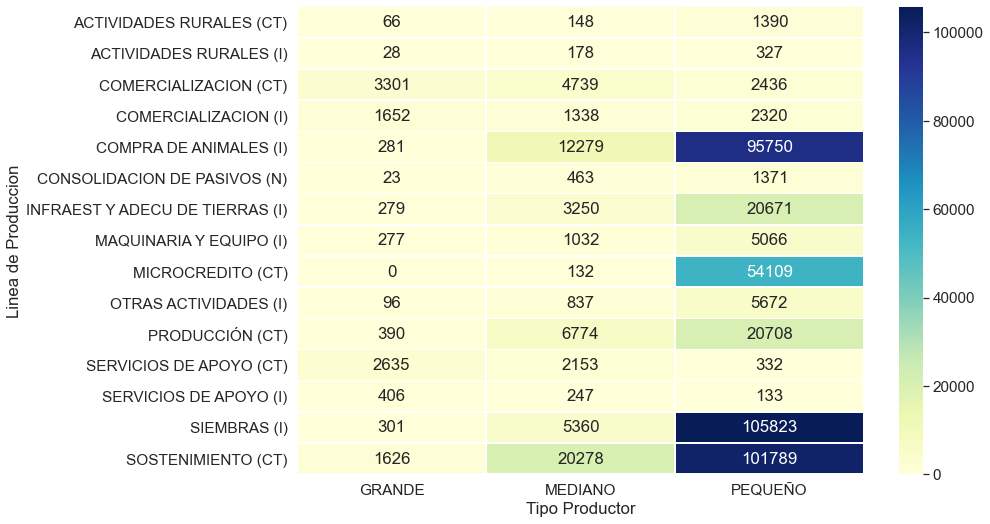

In [37]:
ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="YlGnBu")

- **¿Por qué?**

En en sus acciones la visualización **analiza y presenta** ya que el propósito es mostrar la cantidad de colocaciones de créditos por línea de producción y tipo de productor, siendo los productores grandes los que presentan el menor número de colocaciones de créditos mientras que los productores pequeños son los que más colocaciones de crédito tienen en las líneas de producción de Sostenimiento, Siembras y compra de animales. Por otro lado, el gráfico **consulta y compara** en especial para el tipo de productor pequeño en donde se presentan diferencias significativas entre la cantidad de créditos por línea de producción, de forma que se puede hacer una rápida comparación entre estas. De igual manera, **consulta y resume** debido a que la visualización hace un sumarización de los conteos de crédito de forma que se pueden identificar facilmente a que línea de producción va la colocación de crédito dependiendo el tipo de productor.

Con respecto al objetivo, considero que este es **Outliers** para todos los datos dado que por medio del gráfico se pueden identificar la cantidad de colocaciones de crédito más altas y bajas por tipo de productor y línea de producción, como por ejemplo el productor pequeño presenta 4 valores atipicos en las líneas de producción: Sostenimiento, siembra, compra de animales y microcrédito. 

- **¿Cómo?**

El gráfico presenta una **alineación** debido a sus atributos categóricos (2 keys) lo que hace que esta tenga una alineación matricial conformada por la línea de producción y el tipo de productor, así mismo presenta el **color** para presentar el conteo de la colocación de los créditos agropecuarios.

**Marcas**

La marca para este gráfico son el área de cada rectángulo que representa a un tipo de productor y línea de producción.

**Canales**

- Canal de posición espacial vertical para el atributo categórico de las líneas de producción.
- Canal de posición espacial horizontal para el atributo categórico del tipo de productor.
- Canal de color para el atributo cuantitativo que representa la cantidad colocaciones del crédito por cada una de las líneas de producción y tipo de productor.


**Mejoras posibles**

Una mejora posible que haría sería el de implementar small multiples por tipo de productor con el objetivo de poder identificar en el mapa de calor las líneas de producción con mayor cantidad de colocaciones crédito debido a que en los productores mediando y grande, en especial este último, no se logra ver una diferencia notable en el color en las líneas de crédito debido a que el productor pequeño presenta la mayor cantidad de colocaciones de crédito, lo que termina incrementando la escala y no permite apreciar la diferencia por color en los demás productores.

### Modismo temporal: Streamgraph

Debido a la cantidad de atributos que se tiene en la base de datos, se decide hacer un filtro por el departamento de inversión, en donde se escoge a Boyacá ya que este es el departamento con mayor colocaión de créditos agropecuarios para el año 2020. 

In [38]:
df_Boyaca= df_dedupped[(df_dedupped['Departamento Inversion'] == "BOYACA")]

In [39]:
df_Boyaca

,Año,Mes,fuente Colocacion,Id Tipo Prod,Tipo Productor,Valor Inversion,Colocacion,ID Depto,Departamento Inversion,Id Munic,Municipio Inversion,Municipio de PostConflico?,DEPCOL,Departamento de Colocacion de Credito,MUNCOL,Municipio Colocacion de Credito,Plazo,Linea de Credito,Linea de Produccion,ID Rubro,Destino de Credito,Genero,LATITUD,LONGITUD,CANTIDAD,Coordenada,lon,lat,M
11846,2020,1,REDESCUENTO,1,MEDIANO,35000000.0,28000000.0,15,BOYACA,15087,BELEN,N,15,BOYACA,15693,SANTA ROSA DE VITERBO,36,Inversión,SERVICIOS DE APOYO (I),741100,REDES DE FRIO,MUJER,6.083333,-72.916667,1,POINT (-72.9166667 6.0833333),-73.12136,5.755396,1900-01-01
13620,2020,1,SUSTITUTA,0,PEQUEÑO,25000000.0,25000000.0,15,BOYACA,15176,CHIQUINQUIRA,N,15,BOYACA,15176,CHIQUINQUIRA,60,Inversión,SERVICIOS DE APOYO (I),741060,MAQ Y EQUIP USADOS Ó REPAR MAQ Y EQUIPOS,HOMBRE,5.633333,-73.750000,1,POINT (-73.75 5.6333333),-73.12136,5.755396,1900-01-01
18596,2020,1,SUSTITUTA,1,MEDIANO,283179770.0,283179770.0,15,BOYACA,15238,DUITAMA,N,5,ANTIOQUIA,5001,MEDELLIN,60,Inversión,SERVICIOS DE APOYO (I),741160,741160 TRANSPORTE NO ESPECIALIZADO - NUEVO - S...,PERSONA JURÍDICA,5.826944,-73.020278,1,POINT (-73.0202778 5.8269444),-73.12136,5.755396,1900-01-01
28324,2020,1,SUSTITUTA,1,MEDIANO,519555260.0,519555260.0,15,BOYACA,15238,DUITAMA,N,5,ANTIOQUIA,5001,MEDELLIN,60,Inversión,SERVICIOS DE APOYO (I),741160,741160 TRANSPORTE NO ESPECIALIZADO - NUEVO - S...,PERSONA JURÍDICA,5.826944,-73.020278,1,POINT (-73.0202778 5.8269444),-73.12136,5.755396,1900-01-01
29660,2020,1,SUSTITUTA,1,MEDIANO,307534273.0,245254271.0,15,BOYACA,15001,TUNJA,N,5,ANTIOQUIA,5001,MEDELLIN,60,Inversión,SERVICIOS DE APOYO (I),741160,741160 TRANSPORTE NO ESPECIALIZADO - NUEVO - S...,PERSONA JURÍDICA,5.535278,-73.367778,1,POINT (-73.3677778 5.5352778),-73.12136,5.755396,1900-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
513207,2020,12,REDESCUENTO,1,MEDIANO,38601700.0,25000000.0,15,BOYACA,15469,MONIQUIRA,N,15,BOYACA,15469,MONIQUIRA,72,Inversión,COMERCIALIZACION (I),307014,307014 Construcción y compra de infraestructur...,H,5.916667,-73.500000,1,POINT (-73.5 5.9166667),-73.12136,5.755396,1900-12-01
513209,2020,11,REDESCUENTO,1,MEDIANO,7500000.0,6000000.0,15,BOYACA,15187,CHIVATA,N,15,BOYACA,15001,TUNJA,60,Inversión,INFRAEST Y ADECU DE TIERRAS (I),547400,547400 Construcción obras civiles para riego,M,5.533333,-73.266667,1,POINT (-73.2666667 5.5333333),-73.12136,5.755396,1900-11-01
513213,2020,11,REDESCUENTO,1,MEDIANO,7500000.0,6000000.0,15,BOYACA,15187,CHIVATA,N,15,BOYACA,15001,TUNJA,60,Inversión,INFRAEST Y ADECU DE TIERRAS (I),347490,347490 Construcción infraestructura para la pr...,M,5.533333,-73.266667,1,POINT (-73.2666667 5.5333333),-73.12136,5.755396,1900-11-01
513223,2020,11,REDESCUENTO,0,PEQUEÑO,2250000.0,1800000.0,15,BOYACA,15681,SAN PABLO DE BORBUR,N,15,BOYACA,15507,OTANCHE,36,Capital de Trabajo,SOSTENIMIENTO (CT),160000,160000 CAPITAL DE TRABAJO - UNIDAD PRODUCTIVA ...,M,5.750000,-74.083333,1,POINT (-74.0833333 5.75),-73.12136,5.755396,1900-11-01


Se realiza un tabla pivote por el mes y línea de crédito, con el objetivo de obtener los conteos de las colocaciones de crédito agropecuario por los dos atributos mencionados anteriormente. 

In [40]:
Conteo_tipoprod_Boyaca = pd.pivot_table(df_Boyaca, 
                                values='Id Tipo Prod', 
                                index=['M','Linea de Credito'],
                                #columns=['Tipo de Contrato'], 
                                aggfunc='count')
Conteo_tipoprod_Boyaca = pd.DataFrame(Conteo_tipoprod_Boyaca)
Conteo_tipoprod_Boyaca

Id Tipo Prod
M          Linea de Credito                      
1900-01-01 Capital de Trabajo                1287
           Inversión                         1566
           Normalización de Cartera           529
1900-02-01 Capital de Trabajo                1412
           Inversión                         1436
           Normalización de Cartera           726
1900-03-01 Capital de Trabajo                1332
           Inversión                         1470
           Normalización de Cartera           588
1900-04-01 Capital de Trabajo                 821
           Inversión                         1099
           Normalización de Cartera           791
1900-05-01 Capital de Trabajo                1326
           Inversión                          806
           Normalización de Cartera           327
1900-06-01 Capital de Trabajo                1780
           Inversión                         1268
           Normalización de Cartera           278
1900-07-01 Capital de Trabajo                1712
           Inversión                         1991
           Normalización de Cartera           423
1900-08-01 Capital de Trabajo                1492
           Inversión                         1795
           Normalización de Cartera           635
1900-09-01 Capital de Trabajo                1527
           Inversión                         1860
           Normalización de Cartera          7886
1900-10-01 Capital de Trabajo                1514
           Inversión                         1607
           Normalización de Cartera          6262
1900-11-01 Capital de Trabajo                1428
           Inversión                         1370
           Normalización de Cartera           372
1900-12-01 Capital de Trabajo                1533
           Inversión                         1540
           Normalización de Cartera           597

- **¿Qué?**

Los datos que se tienen son de tipo **tabla con un atributo temporal**, está cuenta con 3 atributos y 36 items, en donde el atributo temporal es ordenado secuencial y corresponde al mes en donde se hicieron las colocaciones de los créditos agropecuarios en el departamento de Boyacá. Así mismo, el mes no resulta siendo ciclico debido a que solo se tienen los datos para el año 2020. Por otro lado, se tiene un atributo categórico que refleja la línea de crédito a la que pertenece la colocación y esta desagregada en tres categorías: Inversión, Capital de trabajo y Normalización de cartera, y por último un atributo cuantitativo que equivale a los cantidad de colocacion de créditos otorgados en el departamento de Boyacá en el año 2020.


In [41]:
Conteo_tipoprod_Boyaca.reset_index(inplace=True)
Conteo_tipoprod_Boyaca = Conteo_tipoprod_Boyaca.rename(columns = {'index':'ID','Id Tipo Prod':'Conteo'})
Conteo_tipoprod_Boyaca.head()

,M,Linea de Credito,Conteo
0,1900-01-01,Capital de Trabajo,1287
1,1900-01-01,Inversión,1566
2,1900-01-01,Normalización de Cartera,529
3,1900-02-01,Capital de Trabajo,1412
4,1900-02-01,Inversión,1436


In [42]:
alt.Chart(Conteo_tipoprod_Boyaca).mark_area().encode(
    alt.X('month(M):T'),
    alt.Y('sum(Conteo):Q'),
    alt.Color('Linea de Credito:N'),
    opacity=alt.value(1),
).properties(
    width=800,
    height=600
)

alt.Chart(...)

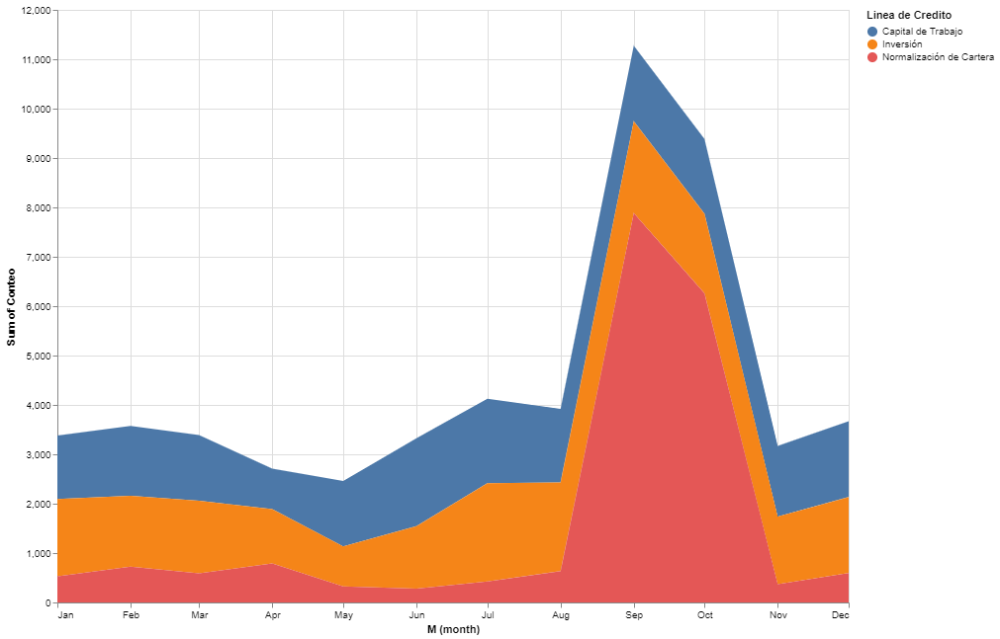

- **¿Por qué?**

En en sus acciones la visualización **Buscar valores** ya que a partir de esto se pueden identificar los meses y líneas de crédito con mayor cantidad de conteos, se pueden buscar los conteos por cada uno de los atributos y así mismo se puede identificar las tendencias que hay en los datos. Por otro lado, el gráfico **consulta y compara** ya que se puede comparar entre los meses en los que más se hicieron colocaciones de crédito, en donde septiembre fue el mes con mayor cantidad de colocaciones y mayo el que menos presento. Así mismo se puede hacer la comparación por las líneas de crédito, en donde se ve que todas tienen aparentemente un comportamiento similar de colocaciones a lo largo de los meses.

Con respecto al objetivo, considero que este es **Tendencia** para todos los datos dado que por medio del gráfico se pueden identificar la cantidad de colocaciones de crédito más altas y bajas por mes y línea de producción, como por ejemplo se puede identificar que los productores recurren más a colocaciones de crédito que pertenecen a la línea de crédito de , al igual de que se puede ver que el mes de septiembre del 2020 fue en donde más se recurrieron a hacer colocaciones de créditos agropecuarios.

- **¿Cómo?**

El gráfico presenta un encode de **expresar** debido a su atributo temporal, pues el gráfico presenta los datos en un orden temporal del mes en los que se hicieron las colocaciones de crédito, por lo cual se puede apreciar la evolución que van teniendo las colocaciones agropecuarias durante el año 2020, así mismo presenta el **color** para presentar el conteo por línea de crédito de la colocación de los créditos agropecuarios.

El objetivo del gráfico es mostrar la cantidad de colocaciones de créditos por línea de crédito y por mes, para poder identificar tendencias y hacer comparaciones entre estos. 

**Marcas**

La marca para este gráfico son las línes que representan los conteos de las colocaciones de crédito por mes y línea de crédito.

**Canales**

- Canal de posición espacial vertical para el atributo cuantitativo de los conteos de colocaciones de crédito.
- Canal de posición espacial horizontal para el atributo temporal del mes.
- Canal de color para el atributo categórico que representa la línea de crédito.


**Mejoras posibles**

Una mejora posible que haría sería el de implementar el texto de la cantidad de conteos de colocaciones ya que permitiría hacer una mejor comparación, al igual esta es posible debido a que no hay una saturación de objetos en el gráfico, no hay tantas categórias y la granularidad temporal es solo de 12 meses.

### Modismo espacial: Coropleto

Este gráfico se realizo en Google Colaboraty, por lo cual el código y los resultados se encontraran en otro archivo. 
Por otro lado, se realizó una tabla con las variables que se van a emplear en el gráfico de coropleto las cuales son Id Depto, Departamento, latitud y longitud del departamento, la línea de crédito y el conteo del número de colocaciones de créditos agropecuarios que se realizaron en el 2020. Esta tabla fue exportada y cargada en Google Colaboraty.

- **¿Qué?**

Los datos que se tienen son **tabla de tipo geométrica - Geometría geográfica** ya que esta esta conformada por items y posiciones, para este caso la tabla presenta 4 atributos que representan la posición: Latitud, longitud, departamento y Id Depto, así las dos primeras son atributos claramente de posición espacial que son derivados de la información geográfica sobre la tierra; mientras el departamento indica el nombre de la zona de la posición espacial presentada por la latitud y longitud, así esta termina siendo una variable categórica con 33 categorías, el Id es una variable cuantitativa que también representa los departamentos. Adicional a estos atributos de posición, hay un atributo categórico que indica de línea de crédito y un atributo cuantitativo que muestra la cantidad de colocaciones de créditos agropecuarios por línea de crédito y departamento. De esta forma se tiene una tabla geométrica con 6 atributos y 99 items. 

In [43]:
df_dpto=df_dedupped.groupby(['ID Depto', 'Departamento Inversion', "lat", "lon", "Linea de Credito"]).agg({"Colocacion" : ["count"]})
df_dpto

Colocacion
                                                                                  count
ID Depto Departamento Inversion lat       lon       Linea de Credito                   
5        ANTIOQUIA              6.913161  -75.59120 Capital de Trabajo            19942
                                                    Inversión                     14918
                                                    Normalización de Cartera      13026
8        ATLANTICO              10.660840 -74.97943 Capital de Trabajo             1384
                                                    Inversión                       387
...                                                                                 ...
97       VAUPES                 0.607142  -70.57153 Inversión                        36
                                                    Normalización de Cartera         10
99       VICHADA                4.666551  -69.43002 Capital de Trabajo              145
                                                    Inversión                       242
                                                    Normalización de Cartera        221

[99 rows x 1 columns]

In [44]:
df_dpto.to_csv("Datos_colocaciones_dpto.csv")

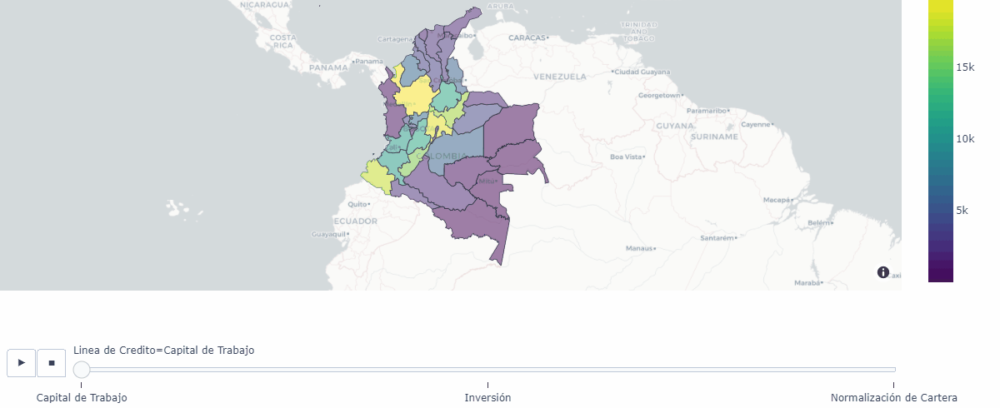

- **¿Por qué?**

En en sus acciones la visualización **Analiza y presenta** ya que a partir de esta se pueden visualizar los departamentos de Colombia con mayor cantidad de colocaciones de crédito, al igual que realizar la comparación de colocaciones en los departamentos por las líneas de crédito. Así mismo, el gráfico **identifica ubicaciones** ya que se puede identificar los departamentos de Colombia con menor y mayor cantidad de colocaciones.

Con respecto al objetivo, considero que este es **Distribuciones geográficas** dado que los datos son de geometría geográfica por lo cual el objetivo es identificar los departamentos según la cantidad de colocaciones, identificar los departamentos en donde se hicieron colocaciones y de ser así saber cuantas se realizaron en el 2020 por línea de crédito. De esta manera se puede saber geograficamente que departamentos tienen mayores créditos agropecuarios y hacia que línea de crédito se inclinan.

- **¿Cómo?**

El gráfico presenta un encode de **Use** debido a que los datos son de geometría geográfica, pues el gráfico se enfoca en la ubicación espacial de acuerdo a sus atributos de posición y adicional a esto muestra los departamentos según la cantidad de colocaciones agropecuarias durante el año 2020, así mismo presenta el **color** para presentar el conteo por colocación de los créditos agropecuarios.

El objetivo del gráfico es mostrar la cantidad de colocaciones de créditos por departamento y con ayuda de la interactividad se puede ver las colocaciones por línea de crédito. 

**Marcas**

La marca para este gráfico son áreas que representan los departamentos de Colombia.

**Canales**

- Canal de espacio para presentar los límites de las marcas de área, en este caso los límites entre cada departamento.
- Canal de color para el atributo cuantitativo de los conteos de colocaciones de créditos agropecuarios por departamento.
- Canal de interactividad para el atributo categórico que representa la línea de crédito.

**Mejoras posibles**

Una mejora posible que haría sería el de implementar el texto de la cantidad de conteos de colocaciones sobre cada uno de los departamentos como una alternativa a la interactividad, ya que permitiría hacer una mejor comparación debido a que la mayoría de departamentos tienen menos de 4000 conteos de colocaciones de crédito. Al igual, hubiera aplicado el mantra de Ben Shneiderman de Overview First, Zoom and Filter, Details on Demand realizadon la visualización primero por regiones, luego departamentos y por último municipios para poder identificar mejor las zonas que solicitan mayor cantidad de colocaciones de crédito enfocadas en el sector agropecuario. Finalmente, otra mejora sería que la escala de colores se mantuviera igual por línea de crédito ya que se puede evidenciar que la línea de crédito de inversión tiene una escala diferente, lo que impide hacer comparaciones de forma adecuada. 

## Gráficos Yulian Rozo

### Modismo multivariado: Árbol de clasificación

Se planteó un árbol de regresión para mirar estos objetos, porque, lo que se pretende con este modismo es ir desagregando todo un país con sus respectivos departamentos, para saber cómo es el comportamiento  individual entre los departamentos y los municipios del posconflicto, se tomo el mes de septiembre de año 2020 para realizar la siguiente visualización dado que si se grafica todo la vigencia de forma general no es muy clara la diferencia en los valores de inversión.

In [105]:
Base_Final = df_dedupped[df_dedupped['Mes']==7]
fig = px.treemap(Base_Final, path=[px.Constant('COLOMBIA'),  'Departamento Inversion',"Municipio de PostConflico?"], values='Valor Inversion',
                  color='Valor Inversion')
fig.show()

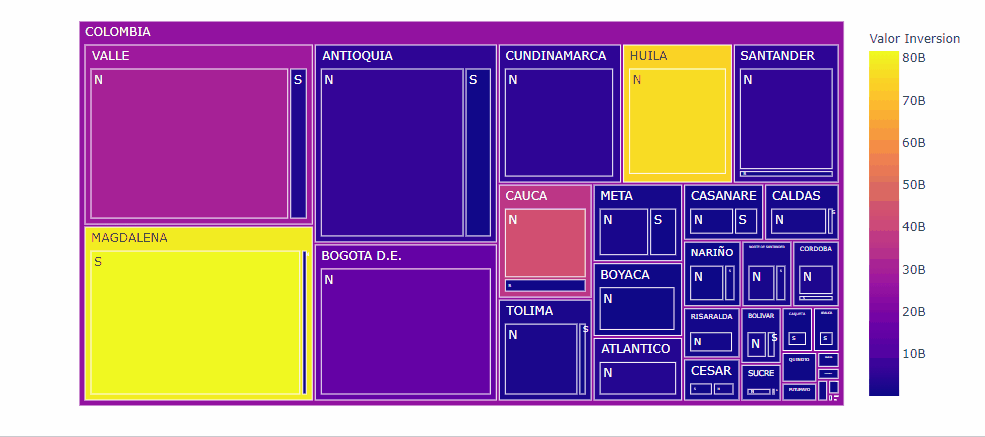

- **¿Qué?**

Por lo anterior el ¿qué? del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para las variables de posición departamento y si cuenta con municipios pertenecientes o no al posconflicto, cabe decir que en estas posiciones no importa su orden, adicionalmente cuenta una variable temporal que solo hace referencia al año 2020 en el mes de Julio. Adicionalmente, existe un atributo cuantitativo que corresponde al valor de inversión que se realizo durante el periodo anteriormente mencionado desagregados por el Departamento de Inversión y el Municipio de postconflicto.  Así, los datos que se tienen son de tipo **árbol**, por otro lado este dataset es estático, ya que son datos que no van a cambiar, es decir, solo se realiza el estudio para los datos que hay hasta el día de la descarga.


- **¿Por qué?**

Para definir el ¿por qué? se cuenta con sustantivos, el cual es el encargado de describir objetos y verbos, el cual describe las acciones.

Dicho lo anterior, en en sus acciones la visualización **analiza y presenta** ya que con esta se busca es mostrar el valor de la inversión de créditos por Departamento y si tiene municipios pertenecientes al posconflicto, siendo los departamentos que tienen municipios que hacen parte del posconflicto los que presentan el menor valor de inversión de créditos. Adicionalmente el grafico **busca y compara** dado a que la visualización localiza o busca como se comportan los Departamentos en función de pertenecer o no al posconflicto, por ultimo, el modismo se plantea para **indentificar y resumir** ya que la visualización hace un sumarización de los valores de inversión de crédito de forma que se pueden identificar facilmente la cantidad para cada departamento.



- **¿Cómo?**

Esta visualización para el Encode se puede evidenciar un **color** de saturación, el cual va a estar ligado con el valor de inversión y según el color va  a representar si el valor es mayor o menor en estos departamentos, por otro lado hay un tamaño en el cual también va a estar referenciado por el valor invertido en los departamentos con municipios de posconflicto, por otra parte su manipulación va a ser de seleccionar y navegar, su facet fue de partición dado que solo se seleccionaron datos del año 2020 del mes de septiembre.

#### Marcas y canales

Las marcas para el modismo de árboles, especialmente este modismo que se presentó cuenta con marcas de area en el cual se puede evidenciar la repartición entre los departamentos y conjuntamente el tamaño de los que tienen mayor valor de inverción en los departamentos que no cuentas con municipios del posconflicto, por otra parte observamos que usa marcas de color en el cual su tonalidad va a ser distinta si tiene mas valor invertido a si tiene menos valor invertido, adicionalmente, utiliza un canal de posición  tanto horizontal como vertical. Finalmente podemos evidenciar que realiza un agrupamiento por municipio posconflicot(SI, NO).

#### Mejores posibles que le realizaría a la visualización

Sería interesante mirar por cada uno de los municipios, adicionalmente sería bueno encontrar un paleta de colores donde se pueda ver mejor la diferencia entre los rangos de valores e inversión.



### Modismo temporal: Streamgraph

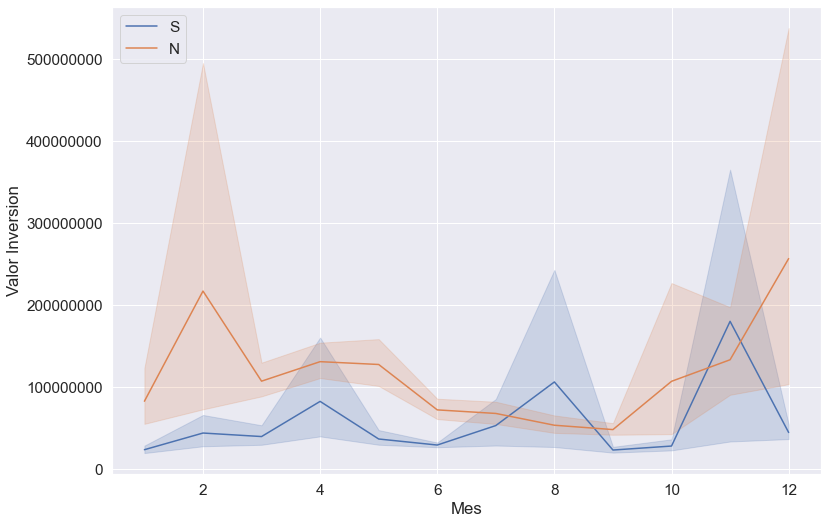

In [41]:
sns.lineplot(data=df_dedupped, x="Mes", y="Valor Inversion", hue="Municipio de PostConflico?")
plt.ticklabel_format(style='plain', axis='y')
plt.legend(loc='upper left')
ax = plt.gca()
plt.show()

- **¿Qué?**

Se evidencia que el Dataset cuenta con las variables, mes y valor de inversión que son ordenadas cuantitativas y la variable valor de inversión cuenta con una dirección secuencial, el tipo de Data Set utilizado será un gráfico de líneas que contiene el mes en el que se realizo la inversión del credito y el total que tuvieron en esos meses. Los datos son datos estáticos, es decir, que no cambian en el tiempo. 

- **¿Poqué?**  
 
En el caso de los verbos utilizados para la descripción de la visualización, se utilizaron el **analizar, y percibir** por medio del gráfico de líneas cómo se comporta la variable municipio de posconflicto con respecto al mes en que se realiza la inversión. En el caso de los sustantivos que se utilizaron para las variables se tienen en cuenta el **presentar y descubrir**, adicionalmente su searh será el de tendencia, dado que se quiere ver cómo se comporta la variable a través del tiempo ysi hay patrones en esta. Por otra parte, el gráfico **consulta y compara** ya que se puede comparar entre los meses en los que más se hicieron inversión de crédito, en donde en diciembre para los departamentos que no cuentan con municipios de posconflicto fue el mes con mayor valor invertido y septiembre el que menos presento.



- **¿Como?**  
 
La visualización fue estructurada en forma de gráfico delineas, estática que identifica los posibles patrones que hay en el tiempo, la visualización es alineada, en la cual, se va a contar con dos ejes los cuales son para el eje “X” la variable mes, y en el eje “Y” se colocará la variable cuantitativa el valorde inversión donde el tiempo suele ir de izquierda a derecha, además, su escala será el municipio de posconflicto. 


#### Marcas y canales

La marca para este gráfico son las línes que representan el valor de inversión de crédito por mes y municipio de posconflicto (SI, NO).En cuanto a los canales , cuwenta con: Canal de posición espacial vertical para el atributo cuantitativo de los valores de inversión de crédito, anal de posición espacial horizontal para el atributo temporal del mesy canal de color para el atributo categórico.

#### Mejores posibles que le realizaría a la visualización

En general la visualización me parece muy buena ya que se ve muy claramente como van aumentando o disminuyendo los valores de inversión, además, se evidencian unas tendencias atípicas en algunos años.

Una mejora posible que haría sería el de implementar el texto de la cantidad de los valores de inversión ya que permitiría hacer una mejor comparación, al igual tambien seria bueno hacer un grafico un poco mas interactivo donde se puediera ver este misma visualización temporall pero segmentada por cada uno los departamentos.



### Modismo espacial: Coropleto

In [67]:
from urllib.request import urlopen
import json
with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    departamentos = json.load(response)

In [78]:
#df_dpto.to_csv("dpto.csv")

In [83]:
df_depts = pd.read_csv("dpto.csv", sep = ",", encoding="utf-8",  decimal=".",
                       dtype={"ID Depto": str})
df_depts.head()

,ID Depto,Departamento Inversion,lat,lon,Municipio de PostConflico?,Valor Inversion
0,5,ANTIOQUIA,6.913161,-75.59120,N,1.522246e+13
1,5,ANTIOQUIA,6.913161,-75.59120,S,9.785915e+11
2,8,ATLANTICO,10.660840,-74.97943,N,1.489769e+12
3,11,BOGOTA D.E.,4.286616,-74.21088,N,4.996403e+12
4,13,BOLIVAR,8.716290,-74.51479,N,5.388518e+11


In [89]:
fig = px.choropleth_mapbox(df_depts, geojson=departamentos, 
                           locations='ID Depto', 
                           featureidkey = 'properties.DPTO',
                           color="Valor Inversion" ,
                           color_continuous_scale="picnic",
                           mapbox_style="carto-positron",
                           animation_frame="Municipio de PostConflico?", 
                           zoom=3, 
                           center = {"lat": 4.570868, "lon": -74.297333},
                           opacity=0.5,
                           labels={'unemp':'Número de colocación de créditos'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

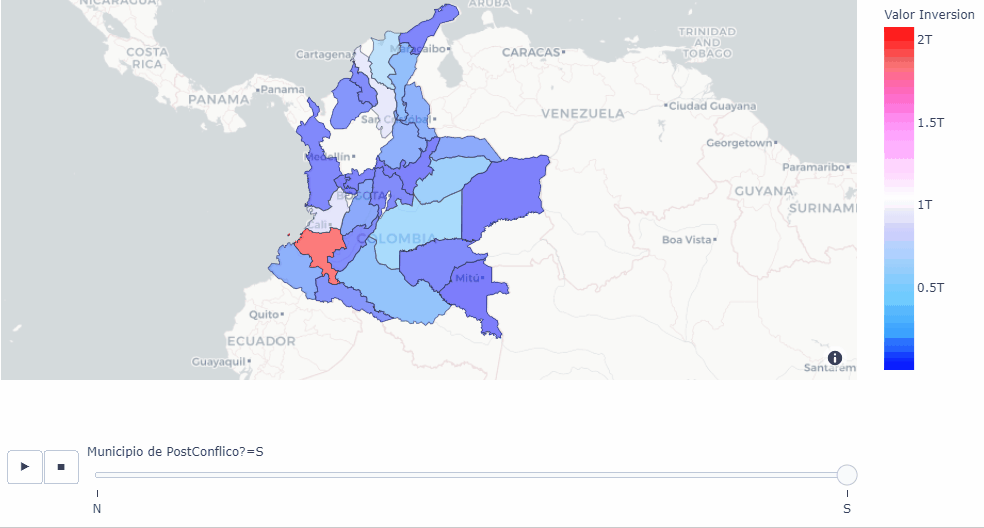

- **¿Qué?**

Del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para las variables de posición departamento, municipio posconflicto, cabe decir que en estas posiciones no importa su orden, adicionalmente, cuenta con una variable temporal que corresponde al año 2020, por otro lado, cuenta con tres variable ordenada cuantitativa para el valor de inversión y id , conjuntamente la dirección de estas variables ordenadas cuentan con una dirección secuencial, esto dado a que parte del punto de que por lo menos valor se invirtio,  y el id parte de una identificación mayor a cero y va realizando un conteo de los mismos.

Por otra parte este tipo de dataset cuenta con diferentes ítems los cuales ya se mencionó, adicionalmente, cuenta con  posiciones, atributos categóricos y ordenados cuantitativos, con los cuales se puede realizar, tablas y geometría espacial,  dado que hay una posicion la cual su orden no importa, por lo cual, de igual manera este dataset es estático, dado que sus datos no se actualizan para años futuros.


- **¿Poqué?**  
 
En en sus acciones la visualización **Analiza y presenta** ya que a partir de esta se pueden visualizar los departamentos de Colombia con mayor valor invertido en los creditos agropacuarios, al igual que realizar la comparación entre los departa,mentos que cuentan con municipios pertenecientes al posconflicto. Así mismo, el gráfico **muestra ubicaciones** ya que se puede identificar los departamentos de Colombia con menor y mayor cantidad valor de inversión.Se considera que este es **Distribuciones geográficas** dado que los datos son de geometría geográfica por lo cual el objetivo es identificar los departamentos según la cantidad de valor invertido, **identificar y mostrar** los departamentos en donde se hicieron inversiones y de ser así saber cuanto fue el valor invertido en el 2020.



- **¿Como?**  
 
El ¿cómo? de este modismo para el Encode se puede evidenciar un arange de **use**, dado, que se está usando los departamentos según su valor de inversión en el 2020, color, el cual, va a estar ligado a la saturación de la tasa si tuvo más valor invertido son bajos, por otra parte su manipulación va a ser de **seleccionar y navegar** , por último se redujo a ciertos filtros que anteriormente se explicaron para después agrupar y crear una única base y adicionalmente se agregaron los departamentos  y también se agregó las latitudes y longitudes.


#### Marcas y canales

La marca para este gráfico son áreas que representan los departamentos de Colombia.En cuanto a los canales estan:Canal de espacio para presentar los límites de las marcas de área, en este caso los límites entre cada departamento, el canal de color para el atributo cuantitativo del valor de la inversión en los créditos agropecuarios por departamento y por ultimo el canal de interactividad para el atributo categórico que representa si dichos departamentos tienen municipios que hacer parte del posconflicto.

#### Mejores posibles que le realizaría a la visualización

Las mejoras que yo le haría al modismo seria el color en el cual está clasificando el valor de inversión dado que si observamos para la más alta como para la más baja es el mismo tono de color, adicionalmente la desagregaría por municipio para saber que está pasando dentro de esos departamentos ya que la variable por la cual quiero ver la clasificaci´´on son los municiíos que hacen parte del posconflicto o no, seria bueno agregarle el nombre de departamento cuando uno se para en la interactividad y que no este solo la latitud y longitud


## Gráficos Sebatian Castro

### Grafico No.1

In [108]:
df_dedupped['Plazo'].value_counts()

36     65972
60     47418
12     39546
24     38001
72     23044
       ...  
217        1
164        1
160        1
155        1
218        1
Name: Plazo, Length: 179, dtype: int64

In [109]:
df_dedupped['Mes'].value_counts()

9     92253
10    83944
8     42462
7     37180
2     33304
12    32704
1     32427
3     31238
11    31159
6     28756
4     22333
5     20706
Name: Mes, dtype: int64

In [110]:
df_dedupped['Linea de Credito'].value_counts()

Capital de Trabajo          198348
Normalización de Cartera    158000
Inversión                   132118
Name: Linea de Credito, dtype: int64

In [111]:
columns = ["Mes" ,
           "Linea de Credito" ,
           "Plazo"
          ]
df1 = df_dedupped.copy()
df1 = df_dedupped[columns]
df1

,Mes,Linea de Credito,Plazo
66,1,Normalización de Cartera,17
1406,1,Inversión,48
1611,1,Inversión,60
5036,1,Inversión,60
5848,1,Inversión,60
...,...,...,...
513229,11,Capital de Trabajo,36
513231,11,Capital de Trabajo,36
513232,11,Capital de Trabajo,13
513233,11,Capital de Trabajo,36


In [112]:
from math import pi
dg=df1[['Mes','Plazo']].sample(10000)
dg

,Mes,Plazo
323717,9,33
215504,8,12
103023,3,59
340512,9,74
191435,7,2
...,...,...
145918,4,15
184578,8,16
147197,4,86
155370,4,108


In [114]:
fig, axes = joypy.joyplot(dg,by="Mes", column="Plazo", 
                          ylabels=False, 
                          xlabels=False, 
                          grid=False, 
                          fill=False, 
                          background='k', 
                          linecolor="w", 
                          linewidth=1,
                          legend=False, 
                          overlap=0.5, 
                          figsize=(6,5),
                          kind="counts", 
                          bins=80)

plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

NameError: name 'joypy' is not defined

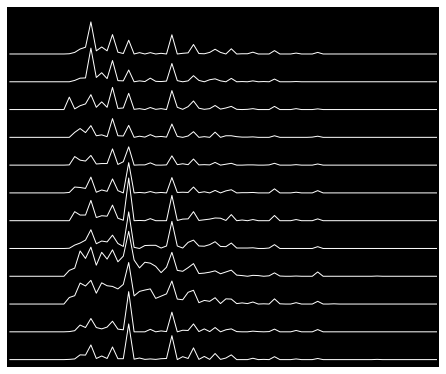

### Que 
en esta vissualizaciones el usuario ve datos como el mes plazo que pueden tener los usuarios en sus colocaciones de credito agropecuarias,  en esta visualizacion vemos como son las tendencias segun los meses del año 2020 y cuanto tienen de plazo segun el mes en que se enceunren donde claramente hay una gran altura de los datos para los meses de junio julio agosto y septiembre que son los meses con mas valor en los plazos respecto al grafico y con muchos atributos cuantitativos tambien ordenados para este caso ya que los meses son ordenados 

### por que 

tienen pocisiones espaciales como comparar tendencias y similitudes junto con localizar valores atipicos que podamos encontar, yo creeria que en el este caso de  grafico de joyplot es bien utilizado con la variable temporal, el usuario requiere ver valores atipicos faciles de encontar segun sus picos mas altos asi como los picos bajos el usuario requeriria solo saber que los datos estan en meses para una mejor comprencion del grafico.

## como
son datos horinzontales temporales ya que son ordenados, marcas de lineas , la visualizacion no requiere de interaccion, las caracteristicas mas efectivas son el tamaño de la linea para distingirlos asi como cada linea representa un mes del año, en especial que sean fechas en este caso la visualizacion solo podria contar con un año ya que es un estudio para el 2020 pero por el otro lado contaba con los meses lo que lo hace muy efectivo a la hora de vizualizar este tipo de datos.

### marcas y canales 
estos datos temporales asi como tienen un canal de tipo horizontal tienen marcas, y son de tipo ordenado.

### mejoras posibles 

desde bajo mi punto quisiera que los datos hubieran tenido mas años para asi poder tener un intervalo de tiempo mas grande para ver como se comportan datos anteriores, mejoraria la temporalidad para poder graficar los años y poder asi obtener graficos mas precisos de esta poblacion, donde tambien quisiera agregarle los años o marcas de color para los diferentes meses, para que el usuario pueda encontrarlos mas facil.

### Gráfico No.2

In [115]:
import seaborn as sns
sns.set_theme(style="ticks")

In [117]:
dg1=df1[['Linea de Credito','Mes','Plazo']].sample(1000)
dg1

,Linea de Credito,Mes,Plazo
107892,Capital de Trabajo,6,6
446759,Capital de Trabajo,11,36
372776,Inversión,12,60
34953,Capital de Trabajo,1,13
497901,Normalización de Cartera,10,41
...,...,...,...
375908,Capital de Trabajo,11,10
223539,Normalización de Cartera,9,14
192850,Inversión,7,60
460906,Capital de Trabajo,12,36


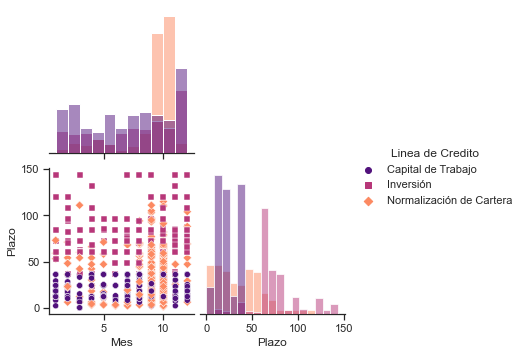

In [118]:
sns.pairplot(dg1, 
             hue="Linea de Credito", 
             markers=["o", "s", "D"], 
             corner = True, 
             diag_kind="hist",
             palette = "magma" )

### Que 
en esta vissualizaciones el usuario ve datos como el plazo el mes y la linea de credito que pueden tener los usuarios en sus colocaciones de credito agropecuarias,  en esta visualizacion vemos como son las tendencias segun los meses del año 2020 y cuanto tienen de plazo segun el mes y linea de credito en que se enceunren donde claramente hay una gran altura de los datos para los meses de septiembre y octubre se produce una gran cantidad de normalizacion de cartera los cuales son los meses con mas valor en los plazos respecto al grafico y con muchos atributos cuantitativos tambien ordenados para este caso ya que los meses son ordenados, tienen valores items y categorias.

### por que 

tienen pocisiones multivariadas como comparar tendencias y similitudes y poder comparar tendencias junto con localizar valores atipicos que podamos encontar, en este caso de  grafico de dispercion es utilizado pero no tiene una forma clara para el usuario, el usuario requiere ver valores atipicos faciles de encontar segun sus valores de los meses mas altos asi como los valores de los meses mas  bajos el usuario requeriria solo saber que los datos estan en meses para una mejor comprencion del grafico.

## como
son datos horinzontales verticales espaciales ya que se encuentran en un mapa de dispercion y marcas de puntos en este caso como marcas del color, y formas para distinguir las lineas de credito, la visualizacion no requiere de interaccion, las caracteristicas mas efectivas son el color para distingirlos y que sean consistentes ya que son datos que tienen magnitudes, los datos necesitan una mayor consistencia para que el mapa de dispercion tenga una forma u tendencia mas clara, con respecto a las graficas de barras podremos encontrar la distribucion que tienen los datos asi como ver valores atipicos segun los meses. 

### marcas y canales 
estos datos canal son de tipo espacial, con marcas de puntos lineas tambien con canal espacial vertical con canales de color y forma.tienen atributos cuantitativos  

### mejoras posibles 

quisiera que los datos fueran mas consistentes como para realizar un mapa de dispercion mas eficeinte , tambien quisiera poder mejorar la oclusion ya que tiene demasiada en el mapa de dispercion y esto puede generar confucion y no permite el facil acceso a datos que el usuario quiera ver, mejoraria la oclusion que puede generar algunos canales como el color ya que en un grafico de barra exactamente el primero no se logra distinguir para los meses de septiembre y octubre como se comportan los datos de inversion.

### Gráfico No.3

In [122]:
import pandas as pd
import pyvista as pv
import vtk

ModuleNotFoundError: No module named 'pyvista'